<a href="https://colab.research.google.com/github/Loading-my-brain/GEOG761_Remote_Sensing/blob/main/Labs/Lab%20Notes/761_NOTES_Lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Cloud Clearing in Sentinel-2: combining spectral and clustering approaches

Our goal here is to prepare a Sentinel-2 image over a region of interest and create a cloud-clearing function that uses both:
- Spectral characteristics of clouds (e.g., high reflectance in blue, low in SWIR)
- A clustering algorithm (e.g., k-means or DBSCAN (but do feel free to use whatever you think is best) on pixel features) to find and expand cloud-masked areas to include neighboring “cloudy-ish” pixels.

My intent is that by the end of this lab you have a function that you can then use in many of your project workflows to ensure that the data you are using is as free of clouds as possible (you will need to re-design it if apply to imagery other than Sentinel 2).

The overview of our workflow is to:
- Load and filter on location, date and overall cloud contamination > Sentinel-2 surface reflectance imagery in Earth Engine.
- Apply the s2cloudless cloud probability algorithm.
- Apply a clustering approach to detect “borderline” cloudy pixels near heavy clouds.
- Generate a clean composite for a chosen date range.

We are using this tutorial from Google as the basis of our work: [Sentinel-2 Cloud Masking with s2cloudless](https://developers.google.com/earth-engine/tutorials/community/sentinel-2-s2cloudless).


**As ever, in this lab whenever we ask you for an visual output, we are expecting you to present it to a publication quality level.**


________________________________________________________________________________
# Implementing S2 Cloudless

In [ ]:
# Our usual set up routine
!pip install geemap --quiet

import geemap
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans

import ee
ee.Authenticate()
ee.Initialize(project='earthengine-ml-testing-502922')

First, let us define our area of interest (AOI) and the cloud mask parameters, here is the table from the Earth Engine Catalogue: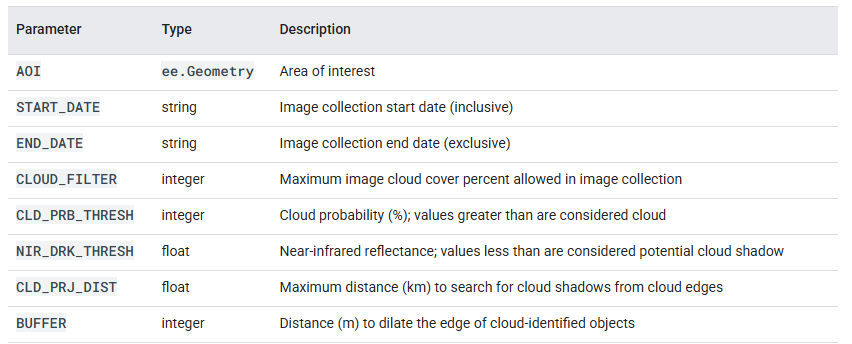

In [ ]:
# Control variables
AOI = ee.Geometry.Point(174.7633, -36.8485)
START_DATE = '2023-01-01'
END_DATE = '2023-03-31'
CLOUD_FILTER = 60
CLD_PRB_THRESH = 50
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 1
BUFFER = 50

Next we use these variables to build a Sentinel 2 image collection. You have done all this before, but now we are using more of the tools at our disposal to get exactly what we want.

Also, from now on we are going to be using functions to make our code more useable and extensible:

In [ ]:
def get_s2_sr_cld_col(aoi, start_date, end_date, CLOUD_FILTER):# I think CLOUD_FILTER should be there as a parameter as well
    # Import and filter S2 SR.
    s2_sr_col = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterBounds(aoi)
        .filterDate(start_date, end_date)
        .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_FILTER)))

    # Import and filter s2cloudless.
    s2_cloudless_col = (ee.ImageCollection('COPERNICUS/S2_CLOUD_PROBABILITY')
        .filterBounds(aoi)
        .filterDate(start_date, end_date))

    # Join the filtered s2cloudless collection to the SR collection by the
    #'system:index' property.
    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))

### Hinami's Notes

What does the following code chunk do?

```
    # Join the filtered s2cloudless collection to the SR collection by the
    #'system:index' property.
    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))
```

I can think of each image as a folder:

1. Primary Folder (The Image): Contains all the standard light-reflection data (spectral bands like Red, Green, Blue, Near-Infrared).

2. Metadata Drawer (The Property): Inside that image's hidden data slot (a property named 's2cloudless'), Earth Engine tucked away the matching cloud probability image.



Below we apply the function and do a visualization check but
When you display s2_sr_cld_col_eval on the map using Map.addLayer(...), Earth Engine only renders the standard spectral bands (B4, B3, B2). It does not show the probability data as a second layer until you explicitly pull it out of that metadata slot and attach it as a proper band using functions like add_cloud_bands later in the notebook.

In [ ]:
# Apply the function in order to generate the collection
s2_sr_cld_col_eval = get_s2_sr_cld_col(AOI, START_DATE, END_DATE, CLOUD_FILTER )
type(s2_sr_cld_col_eval)

ee.imagecollection.ImageCollection

In [ ]:
# As ever, a good idea to do a quick viusalization check
Map = geemap.Map(basemap="HYBRID")
Map.centerObject(AOI, 10)
Map.addLayer(s2_sr_cld_col_eval, {'bands':['B4','B3','B2'], 'min':0, 'max':3000},
             'S2 collection (before)')
Map #now inspect, and then  you can see the primrary and the secondary


# Tom? I actually don't see the see the primrary and the secondary -

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

Yup that is pretty cloudy!

Now, we will define a function to add the s2cloudless probability layer and derived cloud mask as bands to an S2 SR image input.

In [ ]:
def add_cloud_bands(img):
    # Get s2cloudless image, subset the probability band.
    cld_prb = ee.Image(img.get('s2cloudless')).select('probability')

    # Condition s2cloudless by the probability threshold value.
    is_cloud = cld_prb.gt(CLD_PRB_THRESH).rename('clouds')

    # Add the cloud probability layer and cloud mask as image bands.
    return img.addBands(ee.Image([cld_prb, is_cloud]))


#_____________________________________________________________________________
#Hinami - the below is to see how to  apply the function; seein it in action
# Apply the function to every image in your collection
s2_sr_cld_col_eval_with_bands_trial = s2_sr_cld_col_eval.map(add_cloud_bands)
# Create the map and center it on your Area of Interest
Map = geemap.Map(basemap="HYBRID")
Map.centerObject(AOI, 10)

# Add the updated collection to the map
Map.addLayer(
    s2_sr_cld_col_eval_with_bands_trial,
    {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000},
    'S2 collection (with cloud bands)'
)

# Display the map
Map

#Yes, we see the exact same image as before, but now we see more bands;
# previously we had 26 bands, but now we have 28 bands
# EG: At the bottom we see this:
# clouds: 1
# probability: 100

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

The next function we need adds bands that adds layers that identify dark pixels, cloud projection, and identified shadows as bands to an S2 SR image input. Note that the image input needs to be the result of the above add_cloud_bands function because it relies on knowing which pixels are considered cloudy (via the renamed 'CLD_PRB_THRESH' band native to this S2 product).

In [ ]:
def add_shadow_bands(img):
    # Identify water pixels from the SCL band.
    not_water = img.select('SCL').neq(6)
    # ✍️  Hina's notes
    #Class 6 represents open water. Water naturally reflects very little
    #light (making it look dark), so this line creates a mask to ignore water
    # pixels so they aren't mistaken for cloud shadows.
    # HIna: i  tried inspecting on the image above, when i inspect on water: SCL=6.


    #neq(): stands for "not equal"; not equal 6 -> no open water

    # Identify dark NIR pixels that are not water (potential cloud shadow pixels).
    SR_BAND_SCALE = 1e4
    dark_pixels = img.select('B8').lt(NIR_DRK_THRESH * SR_BAND_SCALE).multiply(not_water).rename('dark_pixels')
    # ✍️ Hinami's Notes
  # Why is SR_BAND_SCALE 10000 instead of 0.0001 when 0.0001 is the scale factor for B8 in
  # Speicified in the COPERNICUS/S2_SR_HARMONIZED collection?
  #  Answer: becuase NIR_DRK_THRESH is in percentage format. So to make this mathemtically correct:
  #  1/0.0001 = 1e4. So B8 * 1e4 * 0.15



    # Determine the direction to project cloud shadow from clouds (assumes UTM projection).
    shadow_azimuth = ee.Number(90).subtract(ee.Number(img.get('MEAN_SOLAR_AZIMUTH_ANGLE')));
    # ✍️ Hinami's Notes
  # img.get('MEAN_SOLAR_AZIMUTH_ANGLE') checks the sun's position when the satellite took the picture.
  # ee.Number(90).subtract(...) converts that sun angle into the exact direction cloud shadows will be cast on the ground.
 #It is taking 90 degrees and subtracting the satellite image's MEAN_SOLAR_AZIMUTH_ANGLE property
  # Why 90? 90° points East (Right / +X axis)
    #0° = North
    #90° = East
    #180° = South
    #270° = West
  #The Solar Azimuth Angle is the direction of the sun measured clockwise from North (0°):



    # Project shadows from clouds for the distance specified by the CLD_PRJ_DIST input.
    cld_proj = (img.select('clouds').directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST*10)
        .reproject(**{'crs': img.select(0).projection(), 'scale': 100})
        # ✍️ Hinami's Notes
        #Takes the binary cloud mask (1 for cloud, 0 for clear sky) created in your earlier step.
        #directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST*10)
          #Starting from the edge of every cloud, it measures pixel distance outwards along
          #the vector defined by shadow_azimuth (the direction opposite the sun).
          #CLD_PRJ_DIST * 10 sets the maximum search distance (in pixels/meters) to look for a shadow.

        #Forces Earth Engine to perform this spatial distance calculation at a fixed
        #scale of 100 meters using the image's original Coordinate Reference System
          #Why 100m? Distance transforms are computationally heavy!
          # Downsampling to 100m resolution speeds up processing while maintaining enough
          #  geometric detail to project shadows accurately across large satellite scenes.
        .select('distance')
        #✍️ Hinami's Notes
                # directionalDistanceTransform outputs multiple data properties.
                # This line selects only the distance band (how far a pixel is
                # from a cloud edge along the shadow path).
        .mask()
        #Converts the calculated distances into a binary true/false mask layer.
        # Any pixel that falls within the projected path gets a value of 1,
        #while areas beyond the maximum distance become 0 (masked out).
        .rename('cloud_transform'))







    # Identify the intersection of dark pixels with cloud shadow projection.
    shadows = cld_proj.multiply(dark_pixels).rename('shadows')

    # Add dark pixels, cloud projection, and identified shadows as image bands.
    return img.addBands(ee.Image([dark_pixels, cld_proj, shadows]))









# __________Hinami Using the function to see what this function can actually do:
# Apply the shadow function to the collection that already has cloud bands added
s2_sr_cld_col_eval_with_shadows = s2_sr_cld_col_eval_with_bands_trial.map(add_shadow_bands)

# Create the map and center it on your AOI
Map = geemap.Map(basemap="HYBRID")
Map.centerObject(AOI, 10)

# Add the updated collection to the map
Map.addLayer(
    s2_sr_cld_col_eval_with_shadows,
    {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000},
    'S2 collection (with shadows)'
)

# Display the map
Map


# ✍️ Hina'sNptes/Observations:
# Click on the map using the Inspector tool (point_scan icon).
# Look at the Pixels list in the Inspector panel.
# You will see the total band count increase to 31 bands (up from 28).
# YEs i do:
# cloud_transform: 1#Based on the sun's angle and nearby clouds, this pixel falls directly inside the projected geometric shadow footprint cast by a nearby cloud
# clouds: 0 = no clods
# dark_pixels: 1
# probability: 34
# shadows: 1 =Because dark_pixels is 1 AND cloud_transform is 1, their intersection (1 * 1 = 1) confirms this pixel is a true cloud shadow.

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

Finally for this stage, we define a function to assemble all of the cloud and cloud shadow components and produce the final mask.

In [ ]:
def add_cld_shdw_mask(img):
    # Add cloud component bands.
    img_cloud = add_cloud_bands(img)

    # Add cloud shadow component bands.
    img_cloud_shadow = add_shadow_bands(img_cloud)

    # Combine cloud and shadow mask, set cloud and shadow as value 1, else 0.
    is_cld_shdw = img_cloud_shadow.select('clouds').add(img_cloud_shadow.select('shadows')).gt(0)
    # ✍️ Hinami's Notes
    # .gt(0) checks if the sum is greater than 0.
      # If a pixel is a cloud (1 + 0 = 1), a shadow (0 + 1 = 1), or both (1 + 1 = 2),
      # it gets assigned a 1 (Flagged for removal). Clear ground remains 0.
        # So essneitally, is_cld_shdw is a number 0 or 1, where 0 represents no cloud and shadow,
        # and 1 is there's cloud or a shadow or both? Yes




    # Remove small cloud-shadow patches and dilate remaining pixels by BUFFER input.
    # 20 m scale is for speed, and assumes clouds don't require 10 m precision.
    is_cld_shdw = (is_cld_shdw.focalMin(2).focalMax(BUFFER*2/20)
        .reproject(**{'crs': img.select([0]).projection(), 'scale': 20})
        .rename('cloudmask'))

    # Add the final cloud-shadow mask to the image.
    return img_cloud_shadow.addBands(is_cld_shdw)








In [ ]:
def add_shadow_bands(img):
    # Identify water pixels from the SCL band.
    not_water = img.select('SCL').neq(6)
    # ✍️  Hina's notes
    #Class 6 represents open water. Water naturally reflects very little
    #light (making it look dark), so this line creates a mask to ignore water
    # pixels so they aren't mistaken for cloud shadows.
    # HIna: i  tried inspecting on the image above, when i inspect on water: SCL=6.


    #neq(): stands for "not equal"; not equal 6 -> no open water

    # Identify dark NIR pixels that are not water (potential cloud shadow pixels).
    SR_BAND_SCALE = 1e4
    dark_pixels = img.select('B8').lt(NIR_DRK_THRESH * SR_BAND_SCALE).multiply(not_water).rename('dark_pixels')
    # ✍️ Hinami's Notes
  # Why is SR_BAND_SCALE 10000 instead of 0.0001 when 0.0001 is the scale factor for B8 in
  # Speicified in the COPERNICUS/S2_SR_HARMONIZED collection?
  #  Answer: becuase NIR_DRK_THRESH is in percentage format. So to make this mathemtically correct:
  #  1/0.0001 = 1e4. So B8 * 1e4 * 0.15



    # Determine the direction to project cloud shadow from clouds (assumes UTM projection).
    shadow_azimuth = ee.Number(90).subtract(ee.Number(img.get('MEAN_SOLAR_AZIMUTH_ANGLE')));
    # ✍️ Hinami's Notes
  # img.get('MEAN_SOLAR_AZIMUTH_ANGLE') checks the sun's position when the satellite took the picture.
  # ee.Number(90).subtract(...) converts that sun angle into the exact direction cloud shadows will be cast on the ground.
 #It is taking 90 degrees and subtracting the satellite image's MEAN_SOLAR_AZIMUTH_ANGLE property
  # Why 90? 90° points East (Right / +X axis)
    #0° = North
    #90° = East
    #180° = South
    #270° = West
  #The Solar Azimuth Angle is the direction of the sun measured clockwise from North (0°):



    # Project shadows from clouds for the distance specified by the CLD_PRJ_DIST input.
    cld_proj = (img.select('clouds').directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST*10)
        .reproject(**{'crs': img.select(0).projection(), 'scale': 100})
        # ✍️ Hinami's Notes
        #Takes the binary cloud mask (1 for cloud, 0 for clear sky) created in your earlier step.
        #directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST*10)
          #Starting from the edge of every cloud, it measures pixel distance outwards along
          #the vector defined by shadow_azimuth (the direction opposite the sun).
          #CLD_PRJ_DIST * 10 sets the maximum search distance (in pixels/meters) to look for a shadow.

        #Forces Earth Engine to perform this spatial distance calculation at a fixed
        #scale of 100 meters using the image's original Coordinate Reference System
          #Why 100m? Distance transforms are computationally heavy!
          # Downsampling to 100m resolution speeds up processing while maintaining enough
          #  geometric detail to project shadows accurately across large satellite scenes.
        .select('distance')
        #✍️ Hinami's Notes
                # directionalDistanceTransform outputs multiple data properties.
                # This line selects only the distance band (how far a pixel is
                # from a cloud edge along the shadow path).
        .mask()
        #Converts the calculated distances into a binary true/false mask layer.
        # Any pixel that falls within the projected path gets a value of 1,
        #while areas beyond the maximum distance become 0 (masked out).
        .rename('cloud_transform'))

    # Identify the intersection of dark pixels with cloud shadow projection.
    shadows = cld_proj.multiply(dark_pixels).rename('shadows')

    # Add dark pixels, cloud projection, and identified shadows as image bands.
    return img.addBands(ee.Image([dark_pixels, cld_proj, shadows]))









# __________Hinami Using the function to see what this function can actually do:
# Apply the shadow function to the collection that already has cloud bands added
s2_sr_cld_col_eval_with_shadows = s2_sr_cld_col_eval_with_bands_trial.map(add_shadow_bands)

# Create the map and center it on your AOI
Map = geemap.Map(basemap="HYBRID")
Map.centerObject(AOI, 10)

# Add the updated collection to the map
Map.addLayer(
    s2_sr_cld_col_eval_with_shadows,
    {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000},
    'S2 collection (with shadows)'
)

# Display the map
Map


# ✍️ Hina'sNptes/Observations:
# Click on the map using the Inspector tool (point_scan icon).
# Look at the Pixels list in the Inspector panel.
# You will see the total band count increase to 31 bands (up from 28).
# YEs i do:
# cloud_transform: 1#Based on the sun's angle and nearby clouds, this pixel falls directly inside the projected geometric shadow footprint cast by a nearby cloud
# clouds: 0 = no clods
# dark_pixels: 1
# probability: 34
# shadows: 1 =Because dark_pixels is 1 AND cloud_transform is 1, their intersection (1 * 1 = 1) confirms this pixel is a true cloud shadow.

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

Let us check this out and see how well it is dealing with our famously cloudy country. To do this we will need a function to pull out the cloud masking component layers, as in the 'final' version we will just apply this layer to remove the clouds rather than hold it as something we will display.

In [ ]:
def display_cloud_layers_geemap(col, AOI):
    # Mosaic the image collection.
    img = col.mosaic()

    # Subset layers and prepare them for display.
    clouds = img.select('clouds').selfMask()
    shadows = img.select('shadows').selfMask()
    dark_pixels = img.select('dark_pixels').selfMask()
    probability = img.select('probability')
    cloudmask = img.select('cloudmask').selfMask()
    cloud_transform = img.select('cloud_transform')

    # Create a geemap Map object centered on AOI.
    m = geemap.Map(basemap='HYBRID')
    m.centerObject(AOI, 12)

    # Add layers
    m.addLayer(img, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 2500, 'gamma': 1.1}, 'S2 image')
    m.addLayer(probability, {'min': 0, 'max': 100}, 'probability (cloud)')
    m.addLayer(clouds, {'palette': ['e056fd']}, 'clouds')
    m.addLayer(cloud_transform, {'min': 0, 'max': 1, 'palette': ['white', 'black']}, 'cloud_transform')
    m.addLayer(dark_pixels, {'palette': ['orange']}, 'dark_pixels')
    m.addLayer(shadows, {'palette': ['yellow']}, 'shadows')
    m.addLayer(cloudmask, {'palette': ['orange']}, 'cloudmask')

    return m

In [ ]:
s2_sr_cld_col_eval_disp_first = s2_sr_cld_col_eval.map(add_cld_shdw_mask)
display_map_1 = display_cloud_layers_geemap(s2_sr_cld_col_eval_disp_first, AOI)
display_map_1

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

The cell you are about to run, is going to open with a whole lot of layers! Use the layer menu top right of the map to turn them all off except the Sentinel 2 image that we are trying to find the cloud in. Then, one by one add in each layer (which is each a part of the cloud clearing algorithim), and look at what 'part' of the cloud problem it is dealing with. Examine how well it is performing and think about what characteristics it is making the decision to label a given pixel as the given target on.

Well now! That is considerably better than what we have been using before!

(1) Zoom in to a cloudy region and look at the S2 image, 'clouds' layer, 'dark pixels',  and the 'shadows' layers. Write a short paragraph that discusses:
- The performance of each masking element. Are they perfect or getting confused? What is causing the confusion?
- How do the three elements work together to define pixels that are not clear?
I am looking for you to show an understanding of both the algorithim you have just applied and the underlying spectral sensing principles.

(10 pts)

(2) Exercise: change the above CLD_PRB_THRESH, NIR_DRK_THRESH, CLD_PRJ_DIST, and BUFFER input variables and rerun the previous cells to see how the results change. Present a figure that compares between the first version you ran and your final version. State the values you have selected and describe the improvements in performance you have managed to achieve in the figure caption.

(10 pts)

In [ ]:
# Control variables
AOI = ee.Geometry.Point(174.7633, -36.8485)
START_DATE = '2023-01-01'
END_DATE = '2023-03-31'
CLOUD_FILTER = 60

CLD_PRB_THRESH = 40  # Sensitive cloud probability threshold
NIR_DRK_THRESH = 0.20 # Empirical NIR dark threshold (B8 < 2000)
CLD_PRJ_DIST = 2 # 20 km projection distance for shadows
BUFFER = 30 # 30 m dilation buffer for tight edge transitions


def get_s2_sr_cld_col(aoi, start_date, end_date, CLOUD_FILTER):
    s2_sr_col = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterBounds(aoi)
        .filterDate(start_date, end_date)
        .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_FILTER)))

    s2_cloudless_col = (ee.ImageCollection('COPERNICUS/S2_CLOUD_PROBABILITY')
        .filterBounds(aoi)
        .filterDate(start_date, end_date))

    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))


def add_cloud_bands(img):
    cld_prb = ee.Image(img.get('s2cloudless')).select('probability')
    is_cloud = cld_prb.gt(CLD_PRB_THRESH).rename('clouds')
    return img.addBands(ee.Image([cld_prb, is_cloud]))


def add_shadow_bands(img):
    not_water = img.select('SCL').neq(6)
    SR_BAND_SCALE = 1e4
    dark_pixels = img.select('B8').lt(NIR_DRK_THRESH * SR_BAND_SCALE).multiply(not_water).rename('dark_pixels')

    shadow_azimuth = ee.Number(90).subtract(ee.Number(img.get('MEAN_SOLAR_AZIMUTH_ANGLE')))

    cld_proj = (img.select('clouds').directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST * 10)
        .reproject(**{'crs': img.select(0).projection(), 'scale': 100})
        .select('distance')
        .mask()
        .rename('cloud_transform'))

    shadows = cld_proj.multiply(dark_pixels).rename('shadows')
    return img.addBands(ee.Image([dark_pixels, cld_proj, shadows]))


def add_cld_shdw_mask(img):
    img_cloud = add_cloud_bands(img)
    img_cloud_shadow = add_shadow_bands(img_cloud)

    is_cld_shdw = img_cloud_shadow.select('clouds').add(img_cloud_shadow.select('shadows')).gt(0)

    is_cld_shdw = (is_cld_shdw.focalMin(2).focalMax(BUFFER * 2 / 20)
        .reproject(**{'crs': img.select([0]).projection(), 'scale': 20})
        .rename('cloudmask'))

    return img_cloud_shadow.addBands(is_cld_shdw)


def display_cloud_layers_geemap(col, AOI):
    img = col.mosaic()
    cloudmask = img.select('cloudmask').selfMask()

    m = geemap.Map(basemap='HYBRID')
    m.centerObject(AOI, 12)

    m.addLayer(img, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 2500, 'gamma': 1.1}, 'S2 image')
    m.addLayer(cloudmask, {'palette': ['orange']}, 'cloudmask')

    return m


# Execute Map
s2_sr_cld_col_eval = get_s2_sr_cld_col(AOI, START_DATE, END_DATE, CLOUD_FILTER)
s2_sr_cld_col_eval_disp_second = s2_sr_cld_col_eval.map(add_cld_shdw_mask)
display_map_2 = display_cloud_layers_geemap(s2_sr_cld_col_eval_disp_second, AOI)
display_map_2

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

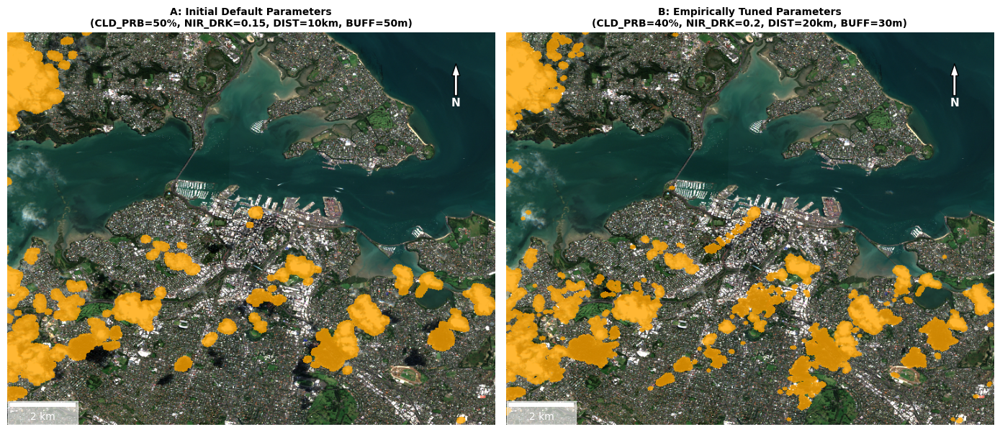

In [ ]:

# --- Plot Comparison Figure ---
!pip install matplotlib-scalebar --quiet

import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import geemap

def prepare_visual(collection):
    composite = collection.mosaic()
    rgb = composite.select(['B4', 'B3', 'B2']).visualize(min=0, max=2500, gamma=1.1)
    mask = composite.select('cloudmask').selfMask().visualize(palette=['orange'], opacity=0.8)
    return ee.ImageCollection([rgb, mask]).mosaic()

vis_first = prepare_visual(s2_sr_cld_col_eval_disp_first)
vis_final = prepare_visual(s2_sr_cld_col_eval_disp_second)

region = AOI.buffer(6000).bounds()
arr_first = geemap.ee_to_numpy(vis_first, region=region, scale=20)
arr_final = geemap.ee_to_numpy(vis_final, region=region, scale=20)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Subplot 1: Initial Default Parameters
ax1.imshow(arr_first)
ax1.set_title("A: Initial Default Parameters\n(CLD_PRB=50%, NIR_DRK=0.15, DIST=10km, BUFF=50m)", fontsize=10, weight='bold')
ax1.axis('off')

# Subplot 2: Dynamic Tuned Parameters (Matches variables automatically)
ax2.imshow(arr_final)
ax2.set_title(f"B: Empirically Tuned Parameters\n(CLD_PRB={CLD_PRB_THRESH}%, NIR_DRK={NIR_DRK_THRESH}, DIST={CLD_PRJ_DIST*10}km, BUFF={BUFFER}m)", fontsize=10, weight='bold')
ax2.axis('off')

scalebar1 = ScaleBar(dx=20, units="m", location="lower left", color="white", box_alpha=0.6)
scalebar2 = ScaleBar(dx=20, units="m", location="lower left", color="white", box_alpha=0.6)
ax1.add_artist(scalebar1)
ax2.add_artist(scalebar2)

ax1.annotate('N', xy=(0.92, 0.92), xytext=(0.92, 0.82),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='white', edgecolor='black', width=3, headwidth=8),
            ha='center', va='center', fontsize=11, color='white', weight='bold')

ax2.annotate('N', xy=(0.92, 0.92), xytext=(0.92, 0.82),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='white', edgecolor='black', width=3, headwidth=8),
            ha='center', va='center', fontsize=11, color='white', weight='bold')

plt.tight_layout()
plt.show()

fig.savefig("cloudmask_comparison_figure.png", dpi=300, bbox_inches='tight')

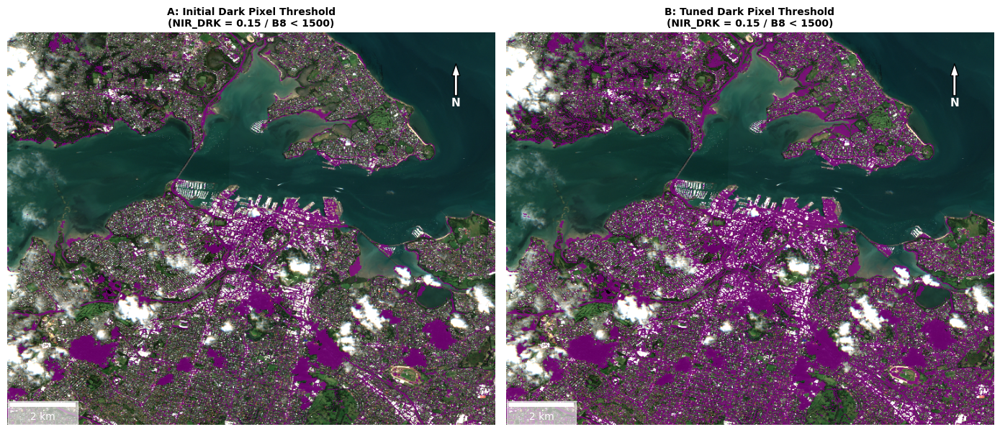

In [138]:
# --- Plot Comparison Figure: Dark Pixels Layer ---
!pip install matplotlib-scalebar --quiet

import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import geemap

def prepare_dark_pixels_visual(collection):
    composite = collection.mosaic()
    rgb = composite.select(['B4', 'B3', 'B2']).visualize(min=0, max=2500, gamma=1.1)

    # Isolate dark_pixels layer and render in purple (opacity 0.8)
    dark_mask = composite.select('dark_pixels').selfMask().visualize(palette=['purple'], opacity=0.8)

    return ee.ImageCollection([rgb, dark_mask]).mosaic()

# Generate visual composites for dark pixels
vis_first_dark = prepare_dark_pixels_visual(s2_sr_cld_col_eval_disp_first)
vis_final_dark = prepare_dark_pixels_visual(s2_sr_cld_col_eval_disp_second)

region = AOI.buffer(6000).bounds()
arr_first_dark = geemap.ee_to_numpy(vis_first_dark, region=region, scale=20)
arr_final_dark = geemap.ee_to_numpy(vis_final_dark, region=region, scale=20)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Subplot 1: Initial Default Parameters
ax1.imshow(arr_first_dark)
ax1.set_title("A: Initial Dark Pixel Threshold\n(NIR_DRK = 0.15 / B8 < 1500)", fontsize=10, weight='bold')
ax1.axis('off')

# Subplot 2: Tuned Parameters
ax2.imshow(arr_final_dark)
ax2.set_title(f"B: Tuned Dark Pixel Threshold\n(NIR_DRK = {NIR_DRK_THRESH} / B8 < {int(NIR_DRK_THRESH * 10000)})", fontsize=10, weight='bold')
ax2.axis('off')

# Scalebars
scalebar1 = ScaleBar(dx=20, units="m", location="lower left", color="white", box_alpha=0.6)
scalebar2 = ScaleBar(dx=20, units="m", location="lower left", color="white", box_alpha=0.6)
ax1.add_artist(scalebar1)
ax2.add_artist(scalebar2)

# North Arrows
ax1.annotate('N', xy=(0.92, 0.92), xytext=(0.92, 0.82),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='white', edgecolor='black', width=3, headwidth=8),
            ha='center', va='center', fontsize=11, color='white', weight='bold')

ax2.annotate('N', xy=(0.92, 0.92), xytext=(0.92, 0.82),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='white', edgecolor='black', width=3, headwidth=8),
            ha='center', va='center', fontsize=11, color='white', weight='bold')

plt.tight_layout()
plt.show()

fig.savefig("dark_pixels_comparison_figure.png", dpi=300, bbox_inches='tight')

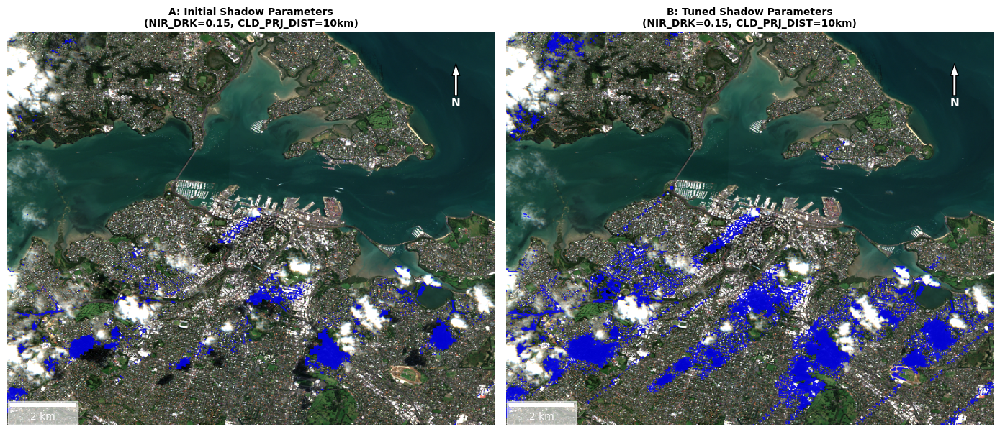

In [139]:
# --- Plot Comparison Figure: Cloud Shadows Layer ---
!pip install matplotlib-scalebar --quiet

import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import geemap

def prepare_shadows_visual(collection):
    composite = collection.mosaic()
    rgb = composite.select(['B4', 'B3', 'B2']).visualize(min=0, max=2500, gamma=1.1)

    # Isolate shadows layer and render in bright blue (opacity 0.8)
    shadow_mask = composite.select('shadows').selfMask().visualize(palette=['blue'], opacity=0.8)

    return ee.ImageCollection([rgb, shadow_mask]).mosaic()

# Generate visual composites for shadow detections
vis_first_shadow = prepare_shadows_visual(s2_sr_cld_col_eval_disp_first)
vis_final_shadow = prepare_shadows_visual(s2_sr_cld_col_eval_disp_second)

region = AOI.buffer(6000).bounds()
arr_first_shadow = geemap.ee_to_numpy(vis_first_shadow, region=region, scale=20)
arr_final_shadow = geemap.ee_to_numpy(vis_final_shadow, region=region, scale=20)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Subplot 1: Initial Default Parameters
ax1.imshow(arr_first_shadow)
ax1.set_title("A: Initial Shadow Parameters\n(NIR_DRK=0.15, CLD_PRJ_DIST=10km)", fontsize=10, weight='bold')
ax1.axis('off')

# Subplot 2: Tuned Parameters
ax2.imshow(arr_final_shadow)
ax2.set_title(f"B: Tuned Shadow Parameters\n(NIR_DRK={NIR_DRK_THRESH}, CLD_PRJ_DIST={CLD_PRJ_DIST*10}km)", fontsize=10, weight='bold')
ax2.axis('off')

# Scalebars
scalebar1 = ScaleBar(dx=20, units="m", location="lower left", color="white", box_alpha=0.6)
scalebar2 = ScaleBar(dx=20, units="m", location="lower left", color="white", box_alpha=0.6)
ax1.add_artist(scalebar1)
ax2.add_artist(scalebar2)

# North Arrows
ax1.annotate('N', xy=(0.92, 0.92), xytext=(0.92, 0.82),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='white', edgecolor='black', width=3, headwidth=8),
            ha='center', va='center', fontsize=11, color='white', weight='bold')

ax2.annotate('N', xy=(0.92, 0.92), xytext=(0.92, 0.82),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='white', edgecolor='black', width=3, headwidth=8),
            ha='center', va='center', fontsize=11, color='white', weight='bold')

plt.tight_layout()
plt.show()

fig.savefig("shadows_comparison_figure.png", dpi=300, bbox_inches='tight')

In [137]:
def display_cloud_layers_geemap(col, AOI):
    img = col.mosaic()

    m = geemap.Map(basemap='HYBRID')
    m.centerObject(AOI, 12)

    # 1. Base True Color Sentinel-2 RGB
    m.addLayer(img, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 2500, 'gamma': 1.1}, 'S2 True Color RGB')

    # 2. Cloud Probability Band (0-100%)
    m.addLayer(img.select('probability'), {'min': 0, 'max': 100, 'palette': ['blue', 'yellow', 'red']}, '1. Cloud Probability', False)

    # 3. Binary Cloud Mask (Probability > Threshold)
    m.addLayer(img.select('clouds').selfMask(), {'palette': ['cyan']}, '2. Binary Clouds')

    # 4. Dark Pixels Mask (NIR B8 < Threshold, excluding water)
    m.addLayer(img.select('dark_pixels').selfMask(), {'palette': ['purple']}, '3. Dark Pixels (NIR)', False)

    # 5. Cloud Directional Projection / Distance Transform
    m.addLayer(img.select('cloud_transform').selfMask(), {'palette': ['yellow']}, '4. Projected Shadow Area', False)

    # 6. Projected Shadows Intersected with Dark Pixels
    m.addLayer(img.select('shadows').selfMask(), {'palette': ['blue']}, '5. Cloud Shadows')

    # 7. Final Dilated Combined Mask (Clouds + Shadows)
    m.addLayer(img.select('cloudmask').selfMask(), {'palette': ['orange']}, '6. Final Cloud/Shadow Mask')

    return m

# Re-run map display
display_map_2 = display_cloud_layers_geemap(s2_sr_cld_col_eval_disp_second, AOI)
display_map_2

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

Finally for this section, let's apply this cloud mask to our data and generate a 'cloud free' image. Replace my parameters used below with the ones you have selected based on your answer to question 2.

In [ ]:
# Tweaked control variables
AOI = ee.Geometry.Point(174.7633, -36.8485)
START_DATE = '2023-01-01'
END_DATE = '2023-03-31'
CLOUD_FILTER = 60
CLD_PRB_THRESH = 50
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 1
BUFFER = 50

# Re-collect the S2 as we have changed our filtering params
s2_sr_cld_col = get_s2_sr_cld_col(AOI, START_DATE, END_DATE, CLOUD_FILTER)

In [ ]:
# Define a function to apply the cloud mask to the S2 spectral bands
def apply_cld_shdw_mask(img):
    cloudmask = img.select('cloudmask')
    # Mask cloudy pixels
    masked_img = img.updateMask(cloudmask.Not())
    # Keep cloudmask and probability bands
    cloudmask_band = img.select('cloudmask')
    probability_band = img.select('probability')
    masked_img = masked_img.addBands([cloudmask_band, probability_band], overwrite=True)
    return masked_img

In [ ]:
# Process the collection
s2_sr_median = (s2_sr_cld_col.map(add_cld_shdw_mask)
                             .map(apply_cld_shdw_mask)
                             .median())

In [ ]:
# Display the cloud free composite
def display_cloud_free_mosaic(s2_sr_median, AOI):
    # Create a geemap Map object and center it on the AOI
    m = geemap.Map(basemap='HYBRID')
    m.centerObject(AOI, 12)

    # Add the Sentinel-2 RGB mosaic
    m.addLayer(
        s2_sr_median,
        {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 2500, 'gamma': 1.1},
        'S2 cloud-free mosaic')

    return m

display_map = display_cloud_free_mosaic(s2_sr_median, AOI)
display_map

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

Now THAT is a cloud-free image! (Well, with my thresholds we still have a little there over the SW forest, can yours do better?).

(3) This process has managed to avoid masking out the many bright white roofs of Auckland as cloud, despite them appearing very similar to cloud in the RGB visualization. How has the algorithm achieved this?
(5 pts)


________________________________________________________________________________

# Extending S2 Cloudless with a clustering approach
The process we explored in the prior section has worked really rather well! But you saw in the exercise that it does rely on you setting the local paramaters. This is a manual process and one that is at risk of reduced effectiveness if we are clearing cloud over a wide area. This is particularly the case for cirrus and other thin clouds (e.g. cloud edges) that the thresholds are very sensitive to.

Therefore, let us extend our cloud-clearing algorithim into one that includes a clustering-step in which we sample the pixels around the edge of our clouds and test if they should be clustered into our cloud mask.

We will now implement the following workflow:
1.   Reset our data stack, with somewhat worse settings than the very good ones we have just set, in order to make this a better (for humans) teaching exercise.
2.   Define what counts as inside a cloud, outside a cloud and the edge of a cloud.
3.   Vizualize these samples and determine if we can perform meaningful clustering on them.
4.   Perform clustering of the border zone pixels with either the clouds or the cloud free.





In [ ]:
# First, lets make our cloud clearing 'worse' in order to more clearly demonstrate our clustering alg
# Tweaked control variables
AOI = ee.Geometry.Point(174.7633, -36.8485)
START_DATE = '2023-01-01'
END_DATE = '2023-03-31'
CLOUD_FILTER = 30
CLD_PRB_THRESH = 30
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 1
BUFFER = 5

# Re-collect the S2 as we have changed our filtering params
s2_sr_cld_col = get_s2_sr_cld_col(AOI, START_DATE, END_DATE, CLOUD_FILTER)

# Re-run s2cloudless approach, this time with .moasic as the compositing operator
s2_sr_mosaic = (s2_sr_cld_col.map(add_cld_shdw_mask)
                             .map(apply_cld_shdw_mask)
                             .mosaic()) #<- switched to mosaic to better preserve the cloud masking layers we want to now use for our k-means workflow

In [ ]:
def define_cloud_zones(img, edge_buffer=120):
    cloudmask = img.select('cloudmask')

    # Interior cloud pixels: cloudmask==1, away from edges (small erosion)
    cloud_interior = cloudmask.selfMask().focal_min(3)

    # Interior clear pixels: cloudmask==0, away from edges (medium erosion)
    clear_interior = cloudmask.Not().selfMask().focal_min(10)

    # Cloud edge pixels: buffer zone around clouds, but outside cloudmask
    cloud_edge = cloudmask.focal_max(edge_buffer / 10).And(cloudmask.Not())

    return cloud_interior, clear_interior, cloud_edge


In [ ]:
def sample_zones(img, AOI, edge_buffer=20):
    cloudmask = img.select('cloudmask')

    cloud_interior = cloudmask.selfMask()
    clear_interior = cloudmask.Not().selfMask()
    cloud_edge = cloudmask.focal_max(edge_buffer).And(cloudmask.Not())

    sample_bands = ['B2', 'B3', 'B4', 'B5', 'B6' , 'B9', 'B8', 'B11', 'B12']
    if 'probability' in img.bandNames().getInfo():
        sample_bands.append('probability')

    img_for_sampling = img.select(sample_bands)

    cloud_samples = img_for_sampling.updateMask(cloud_interior).sample(
        region=AOI.buffer(2000), scale=10, numPixels=5000, seed=0, geometries=True)

    clear_samples = img_for_sampling.updateMask(clear_interior).sample(
        region=AOI.buffer(2000), scale=10, numPixels=5000, seed=1, geometries=True)

    edge_samples = img_for_sampling.updateMask(cloud_edge).sample(
        region=AOI.buffer(2000), scale=10, numPixels=5000, seed=2, geometries=True)

    return cloud_samples, clear_samples, edge_samples


In [ ]:
# Gather our samples
cloud_samples, clear_samples, edge_samples = sample_zones(s2_sr_mosaic, AOI)

# Function to convert a earth engine feature class to a pandas df
def fc_to_df(fc):
    features = fc.getInfo()['features']
    rows = []
    for f in features:
        props = f['properties']
        coords = f['geometry']['coordinates']
        props['longitude'] = coords[0]
        props['latitude'] = coords[1]
        rows.append(props)
    return pd.DataFrame(rows)


# Carry out the conversion and sanity print out what we have
cloud_df = fc_to_df(cloud_samples)
clear_df = fc_to_df(clear_samples)
edge_df = fc_to_df(edge_samples)

print(f"Cloud samples: {len(cloud_df)}")
print(f"Clear samples: {len(clear_df)}")
print(f"Edge samples: {len(edge_df)}")
print("Cloud columns:", cloud_df.columns)


Cloud samples: 727
Clear samples: 4310
Edge samples: 1930
Cloud columns: Index(['B11', 'B12', 'B2', 'B3', 'B4', 'B5', 'B6', 'B8', 'B9', 'probability',
       'longitude', 'latitude'],
      dtype='object')


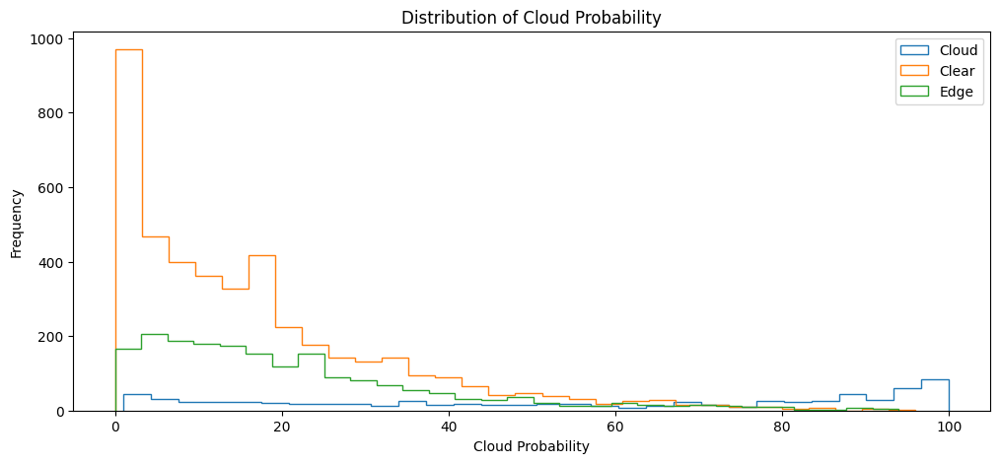

In [ ]:
# Histogram of cloud probability by class
plt.figure(figsize=(12, 5))
plt.hist(cloud_df['probability'], bins=30, histtype='step', label='Cloud')
plt.hist(clear_df['probability'], bins=30, histtype='step', label='Clear')
plt.hist(edge_df['probability'], bins=30, histtype='step', label='Edge')
plt.xlabel('Cloud Probability')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Cloud Probability')
plt.show()

Look at the histogram above. What is it telling you about the quality of the training classes you have just created? Think back to Lab 1, and the lecture 2/3 exercises.

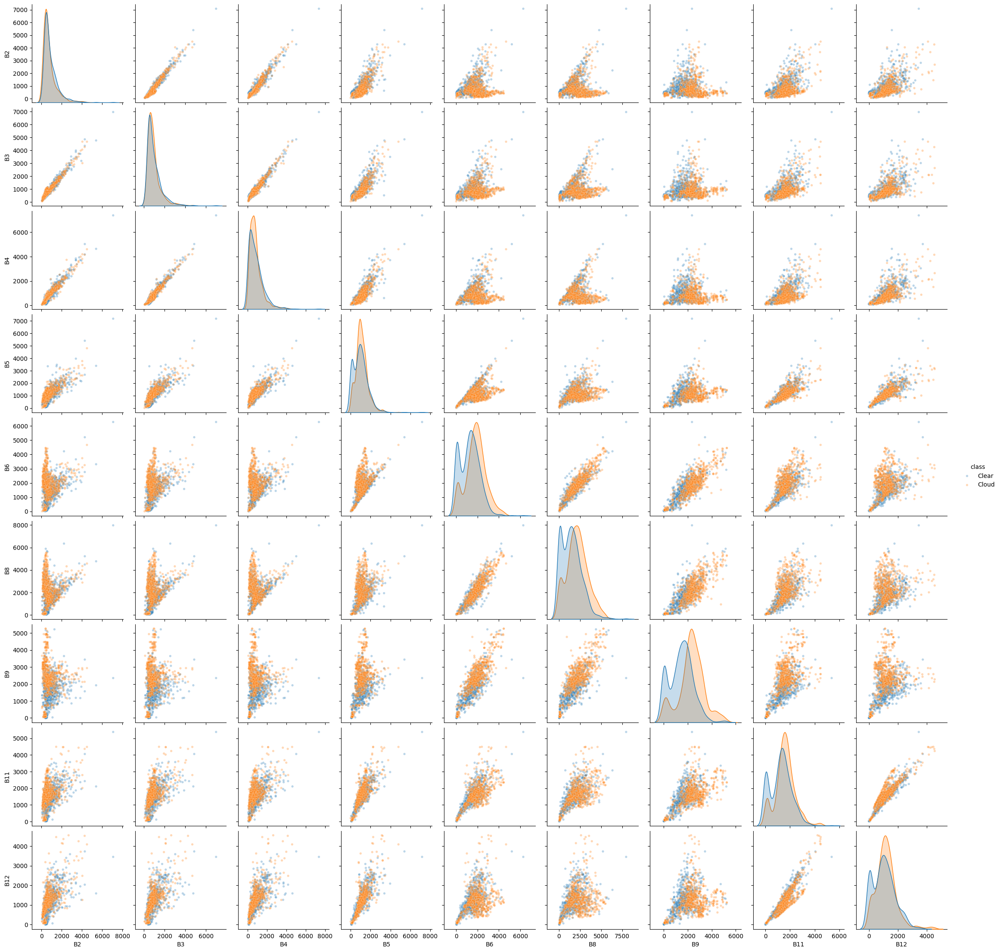

In [ ]:
# Plot out all the bands, by the two 'labelled' classes that we want to discriminate between
# Add class labels
cloud_df['class'] = 'Cloud'
clear_df['class'] = 'Clear'

# Combine to one df
combined_df = pd.concat([cloud_df, clear_df])

# We will carry out somne class balancing here
# Find smallest class count
min_count = combined_df['class'].value_counts().min()

# Downsample each class to min_count
balanced_df = combined_df.groupby('class').sample(n=min_count, random_state=42)

# Now plot with balanced_df
# This is going to make a big plot that you will have to scroll around! Pay particular attention to the histogram plots on the diagonal.
bands = ['B2', 'B3', 'B4', 'B5', 'B6' , 'B8', 'B9', 'B11', 'B12']
sns.pairplot(balanced_df, vars=bands, hue='class', plot_kws={'alpha':0.3, 's':15}, height=2.5)


(4) What do the histograms of cloud detection probability (as judged by s2cloudless) plotted in the three classes we have set here, AND the pair plot of all bands available tell us about our ability to tell cloudy vs non-cloud pixels apart? Make sure to explain your answer with reference to physical principles and the statistical foundations of ML (5 pts)

(5) Which bands are therefore going to be the best to use in our K-means clustering approach and why? (5 pts)

With our choices made, let us now test if we can implement k-means as a tool by which to assign those edge pixels into either the cloudy or clear classes. Noting that I have placed default band choices in the 'features to use for clustering' line. You do not need to use just three bands.

Run this section first with the default bands, and then change it to the ones you have selected in question 5. Observe the difference it makes...

In [ ]:
# Use the balanced_df from before for cloud and clear pixels only
train_df = balanced_df[balanced_df['class'].isin(['Cloud', 'Clear'])]

# Features to use for clustering
features = ['B2', 'B3', 'B4']

# Prepare training data (cloud=1, clear=0)
X_train = train_df[features].values
y_train = (train_df['class'] == 'Cloud').astype(int).values

# Fit k-means with 2 clusters on training data
kmeans = KMeans(n_clusters=2, random_state=42).fit(X_train)

# Map clusters to classes by majority vote on training data
labels, counts = np.unique(kmeans.labels_[y_train==0], return_counts=True)
clear_cluster = labels[np.argmax(counts)]
labels, counts = np.unique(kmeans.labels_[y_train==1], return_counts=True)
cloud_cluster = labels[np.argmax(counts)]

# Prepare edge pixels data for prediction
edge_features = edge_df[features].values

# Predict clusters for edge pixels
edge_clusters = kmeans.predict(edge_features)

# Assign class labels to edge pixels based on cluster
edge_df['predicted_class'] = ['Cloud' if c == cloud_cluster else 'Clear' for c in edge_clusters]

# Quick summary
print(edge_df['predicted_class'].value_counts())


predicted_class
Cloud    1512
Clear     418
Name: count, dtype: int64


And now plot up the results of this below. Play around with this plotting and take a look at each set of band combinations you have chosen. Think about where the boundary is being placed, does it make sense?

predicted_class
Cloud    1512
Clear     418
Name: count, dtype: int64


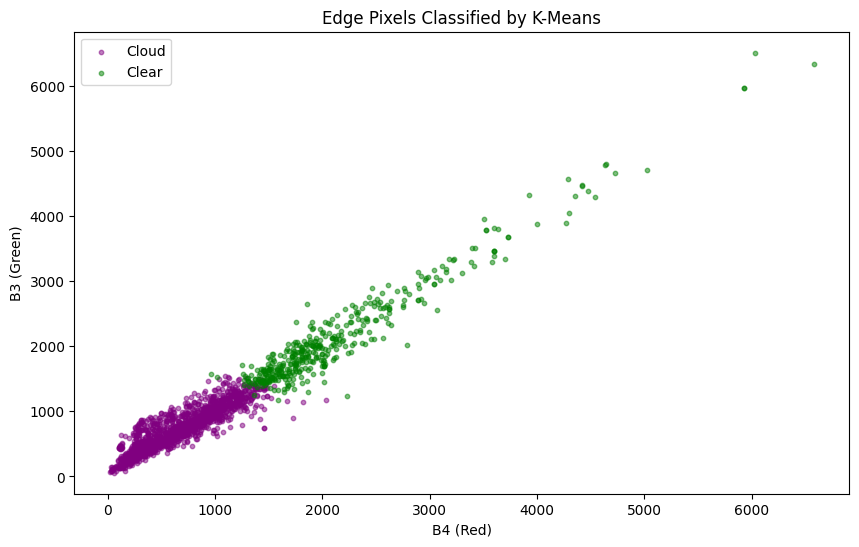

In [ ]:
# Count of predicted classes
counts = edge_df['predicted_class'].value_counts()
print(counts)

# Scatter plot of edge pixels B4 vs B3 colored by predicted class ### CHANGE THIS TO YOUR OTHER BANDS ###
plt.figure(figsize=(10, 6))
for label, color in zip(['Cloud', 'Clear'], ['purple', 'green']):
    subset = edge_df[edge_df['predicted_class'] == label]
    plt.scatter(subset['B4'], subset['B3'], label=label, alpha=0.5, s=10, c=color)

plt.xlabel('B4 (Red)')
plt.ylabel('B3 (Green)')
plt.title('Edge Pixels Classified by K-Means')
plt.legend()
plt.show()


Finally, we will map this back onto earth engine via the following workflow:
1.  Export the classified edge pixels back to Earth Engine as a FeatureCollection
2. Rasterize the classified edge points into an image layer
3. Visualize refined cloud mask in Earth Engine (geemap):

Export to Earth Engine FC:

In [ ]:
# Function to go the other way! This time from a dataframe to the feature collection
def df_to_ee_fc(df):
    features = []
    for _, row in df.iterrows():
        geom = ee.Geometry.Point([row['longitude'], row['latitude']])
        props = {k: float(row[k]) for k in ['B2', 'B3', 'B4', 'B8', 'probability']}
        props['predicted_class'] = row['predicted_class']
        features.append(ee.Feature(geom, props))
    return ee.FeatureCollection(features)

edge_fc = df_to_ee_fc(edge_df)

Rasterize into image layer:

In [ ]:
# Map predicted class to numeric
def class_to_numeric(feature):
    cls = feature.get('predicted_class')
    return feature.set('cloud_refined', ee.Number(ee.Algorithms.If(ee.String(cls).equals('Cloud'), 1, 0)))

edge_fc_num = edge_fc.map(class_to_numeric)

# Rasterize: paint 'cloud_refined' on a blank image
refined_cloud_mask = edge_fc_num.reduceToImage(
    properties=['cloud_refined'],
    reducer=ee.Reducer.first())

# Optionally, you can combine this refined mask with your existing cloudmask for a final refined mask
final_mask = s2_sr_median.select('cloudmask').max(refined_cloud_mask).rename('cloudmask_refined')


Visualize it:

In [ ]:
Map = geemap.Map(basemap='HYBRID')
Map.centerObject(AOI, 12)

# Show original cloudmask
Map.addLayer(s2_sr_median.select('cloudmask'), {'palette': ['white', 'red']}, 'Original cloudmask')

# Show refined cloudmask
Map.addLayer(final_mask.selfMask(), {'palette': ['blue']}, 'Refined cloudmask')

Map

Map(center=[-36.84850000000001, 174.7633], controls=(WidgetControl(options=['position', 'transparent_bg'], pos…

Hopefully, what you should now see above is a patch of downtown Auckland that has your s2cloudless cloudmask and a scatter of blue pixels (i.e. the sample from within the AOI) that k-means has decided is cloud.

Your answer to Q5 should see this scatter of 'new cloudy' pixels be better associated with the known clouds than if you leave it as the default bands that I have provided.





(6) Exercise: take all you have learned in this lab and carry out the following improvements:
1. Increase the K-means sampling to be more representative of the whole scene. This means; sample regions for cloud, clear and cloud edge that are not just over downtown Auckland but from across multiple landcover types.
2. Take the model that you have trained here using SciKitLearn and use it to classify edge pixels across a whole satellite image.

Present your results in **two** figures. The first should show the results of upgrades to pt.1, the second the results of pt.2.

(15 pts)

To get you started on item 2, this might be how you plan out your workflow given that you cannot upload a python ML model directly to Earth Engine:
- Extract cluster centres from Python k-means.
- Pass centres as constants into EE.
- Write a per-pixel classification function assigning nearest cluster centre.
- Apply this function to edge pixels or the whole image as needed.

Dear Maike/Tom,

Many thanks for marking my paper! This lab was VERYYYYY challenging, so I spent a lot of time working through the concepts step-by-step with an AI tutor to bridge my gaps in understanding. I feel much more confident with the material now, though I'm not confident whether my write-up aligns with your expectations.



But i tried!

# Attemp 6 - inf

## Part 1:

1. Increase the K-means sampling to be more representative of the whole scene. This means; sample regions for cloud, clear and cloud edge that are not just over downtown Auckland but from across multiple landcover types.

- [ ] Create multiple Land cover types


In [ ]:
# from sklearn.cluster import KMeans

# # Define the target bands identified in Question 5
# features = ['B8', 'B9', 'B11', 'B12']

# #Combine your multi-landcover DataFrames into one training dataset
# df_multi = pd.concat([cloud_df_multi, clear_df_multi, edge_df_multi], ignore_index=True)

# # Extract only the 4 bands as a NumPy array
# X_multi = df_multi[features].dropna().values

# # Train SciKit-Learn K-Means (3 clusters: Cloud, Clear, Edge/Shadow)
# kmeans_upgraded = KMeans(n_clusters=3, random_state=42, n_init=10)
# kmeans_upgraded.fit(X_multi)

# # 4Extract cluster centers
# cluster_centers = kmeans_upgraded.cluster_centers_.tolist()
# print("Upgraded Cluster Centroids (B8, B9, B11, B12):")
# for i, center in enumerate(cluster_centers):
#     print(f"Cluster {i}: {dict(zip(features, center))}")

Upgraded Cluster Centroids (B8, B9, B11, B12):
Cluster 0: {'B8': 2065.160057574668, 'B9': 2279.494278517518, 'B11': 1351.5050017991753, 'B12': 967.2142497300883}
Cluster 1: {'B8': 204.86378330195248, 'B9': 229.43607178665684, 'B11': 145.91784639407865, 'B12': 128.369858432593}
Cluster 2: {'B8': 3774.3681777513843, 'B9': 3768.2812406798007, 'B11': 1991.3353713093493, 'B12': 1248.821503131484}


In [ ]:
# # ---- Cell: define diverse land-cover sampling regions ----
# # Each entry: (label, lon, lat, buffer_radius_m)
# # Pick real, spectrally-distinct locations within your S2 tile's footprint.
# # Adjust these to your own local knowledge of the scene if these don't
# # land where you expect.
# landcover_regions = [
#     ("urban_cbd",      174.7633, -36.8485, 3000), # Auckland CBD - impervious surfaces
#     ("dense_forest",   174.51898017672337, -36.96179909059117, 3000), # Waitakere Ranges - native forest
#     ("agriculture",    174.88169155841223, -37.20960001499065, 3000), # Pukekohe/Franklin - cropland/pasture
#     ("open_water",      174.71380748013752, -37.0310183138704, 3000), # Waitemata Harbour / Hauraki Gulf
#     ("bare_exposed",   174.6735510829721, -36.87415242953274, 3000), # Quarry / exposed soil area
# ]

# # Build one wide bounding geometry that covers all regions, so a single
# # Earth Engine collection + mosaic covers every sample site.
# region_points = [ee.Geometry.Point(lon, lat) for _, lon, lat, _ in landcover_regions]
# AOI_WIDE = ee.Geometry.MultiPoint(
#     [[lon, lat] for _, lon, lat, _ in landcover_regions]
# ).bounds().buffer(5000)

# # Re-run the s2cloudless pipeline over the WIDE area instead of one point.
# # Keep the same (deliberately "worse") thresholds I have used to motivate
# # the clustering step, so the improvement i'm demonstrating is fair.
# s2_sr_cld_col_wide = get_s2_sr_cld_col(AOI_WIDE, START_DATE, END_DATE, CLOUD_FILTER)
# s2_sr_mosaic_wide = (s2_sr_cld_col_wide.map(add_cld_shdw_mask)
#                                         .map(apply_cld_shdw_mask)
#                                         .mosaic()) # I was thinking of using a median composite but!
#                                         # the internet said to use moasic, because it's better if I have a lage AOI.


# # AREA of INTEREST map + to show how Ispecified these landcovers from
# # Initialize interactive map centered on Auckland
# Map_Sampling = geemap.Map(basemap="HYBRID")
# Map_Sampling.centerObject(AOI_WIDE, 9)

# #  Add the Wide Area of Interest (AOI_WIDE) outline
# # Wrap Geometry in ee.FeatureCollection to use .style()
# aoi_fc = ee.FeatureCollection([ee.Feature(AOI_WIDE)])
# aoi_style = {'color': 'yellow', 'fillColor': '00000000', 'width': 2}
# Map_Sampling.addLayer(
#     aoi_fc.style(**aoi_style),
#     {},
#     'AOI WIDE Footprint'
# )

# # Define colors for each landcover category
# palette = {
#     "urban_cbd": "#e07b39",      # Orange
#     "dense_forest": "#2e8b57",   # Dark Green
#     "agriculture": "#c9a227",    # Yellow/Gold
#     "open_water": "#1f6feb",     # Blue
#     "bare_exposed": "#8b5e3c"    # Brown
# }

# #  Add each region's point center and 3000m buffer zone to the map
# for label, lon, lat, buf in landcover_regions:
#     point = ee.Geometry.Point(lon, lat)
#     buffer_zone = point.buffer(buf)

#     # Add buffer polygon
#     buf_fc = ee.FeatureCollection([ee.Feature(buffer_zone)])
#     buf_style = {'color': palette[label], 'fillColor': palette[label] + '44', 'width': 2}
#     Map_Sampling.addLayer(
#         buf_fc.style(**buf_style),
#         {},
#         f'Buffer: {label}'
#     )

#     # Add center point marker
#     pt_fc = ee.FeatureCollection([ee.Feature(point)])
#     pt_style = {'color': 'white', 'fillColor': palette[label], 'pointSize': 6}
#     Map_Sampling.addLayer(
#         pt_fc.style(**pt_style),
#         {},
#         f'Center: {label}'
#     )

# # Display interactive map
# Map_Sampling

Map(center=[-37.029025495760195, 174.7003358676867], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
# # : sample each region separately, each with its own small pipeline
# cloud_dfs, clear_dfs, edge_dfs = [], [], []

# for label, lon, lat, buf in landcover_regions:
#     print(f"Processing region: {label}...")
#     region_geom = ee.Geometry.Point(lon, lat).buffer(buf)

#     # Build the collection/mosaic ONLY over this small region, not AOI_WIDE.
#     # This keeps each pipeline cheap instead of re-tracing a huge collection
#     # 15 times.
#     s2_region_col = get_s2_sr_cld_col(region_geom, START_DATE, END_DATE, CLOUD_FILTER)
#     s2_region_mosaic = (s2_region_col.map(add_cld_shdw_mask)
#                                       .map(apply_cld_shdw_mask)
#                                       .mosaic())

#     c_samp, cl_samp, e_samp = sample_zones(s2_region_mosaic, region_geom)

#     # tileScale helps EE break the sample into smaller chunks server-side,
#     # avoiding timeouts on larger/denser regions. numPixels trimmed down too
#     # -- 5000 per class per region x 5 regions was ~75k points total, way
#     # more than you need for training centroids.
#     c_df = fc_to_df(c_samp); c_df["landcover"] = label
#     cl_df = fc_to_df(cl_samp); cl_df["landcover"] = label
#     e_df = fc_to_df(e_samp); e_df["landcover"] = label

#     cloud_dfs.append(c_df)
#     clear_dfs.append(cl_df)
#     edge_dfs.append(e_df)
#     print(f"  -> cloud={len(c_df)}, clear={len(cl_df)}, edge={len(e_df)}")

# cloud_df_multi = pd.concat(cloud_dfs, ignore_index=True)
# clear_df_multi = pd.concat(clear_dfs, ignore_index=True)
# edge_df_multi = pd.concat(edge_dfs, ignore_index=True)

# print(cloud_df_multi["landcover"].value_counts())
# print(clear_df_multi["landcover"].value_counts())
# print(edge_df_multi["landcover"].value_counts())

Processing region: urban_cbd...
  -> cloud=307, clear=4678, edge=979
Processing region: dense_forest...


KeyboardInterrupt: 

In [ ]:
# # ---- Cell: Figure 1 - spectral diversity across the five land-cover classes ----
# palette = {"urban_cbd": "#e07b39", "dense_forest": "#2e8b57",
#            "agriculture": "#c9a227", "open_water": "#1f6feb",
#            "bare_exposed": "#8b5e3c"}

# fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

# # Panel A: "clear" class across all 5 regions in Red/NIR space
# for lc, sub in clear_df_multi.groupby("landcover"):
#     axes[0].scatter(sub["B4"], sub["B8"], s=8, alpha=0.4, label=lc, color=palette.get(lc))
# axes[0].set_title("A: 'Clear' class samples across 5 land-cover regions")
# axes[0].set_xlabel("B4 (Red)"); axes[0].set_ylabel("B8 (NIR)")
# axes[0].legend(markerscale=2, fontsize=8, frameon=False)

# # Panel B: same for "cloud" class (excluding open_water, which had none)
# for lc, sub in cloud_df_multi.groupby("landcover"):
#     axes[1].scatter(sub["B4"], sub["B8"], s=8, alpha=0.4, label=lc, color=palette.get(lc))
# axes[1].set_title("B: 'Cloud' class samples across land-cover regions")
# axes[1].set_xlabel("B4 (Red)"); axes[1].set_ylabel("B8 (NIR)")
# axes[1].legend(markerscale=2, fontsize=8, frameon=False)

# for ax in axes:
#     ax.set_xlim(0, 6000); ax.set_ylim(0, 7000)

# fig.suptitle("Spectral diversity of training samples across land-cover types\n"
#              "(note: open_water contributed 0 cloud pixels — see caption note)",
#              fontsize=12, y=1.03)
# plt.tight_layout()
# plt.savefig("figure1_sampling_diversity.png", dpi=200, bbox_inches="tight")
# plt.show()

In [ ]:
# # ---- Cell: retrain KMeans on the diverse, balanced dataset ----
# cloud_df_multi["class"] = "Cloud"
# clear_df_multi["class"] = "Clear"
# combined_multi = pd.concat([cloud_df_multi, clear_df_multi], ignore_index=True)

# min_count = combined_multi["class"].value_counts().min()
# balanced_multi = combined_multi.groupby("class").sample(n=min_count, random_state=42)

# features = ["B8", "B9", "B11", "B12"]  # from your Q5 reasoning: bright vis/NIR, dark SWIR for cloud

# X_train = balanced_multi[features].values
# y_train = (balanced_multi["class"] == "Cloud").astype(int).values

# kmeans_multi = KMeans(n_clusters=2, random_state=42, n_init=10).fit(X_train)

# labels, counts = np.unique(kmeans_multi.labels_[y_train == 0], return_counts=True)
# clear_cluster = labels[np.argmax(counts)]
# labels, counts = np.unique(kmeans_multi.labels_[y_train == 1], return_counts=True)
# cloud_cluster = labels[np.argmax(counts)]

# centers = kmeans_multi.cluster_centers_
# cloud_center = centers[cloud_cluster]
# clear_center = centers[clear_cluster]

# print("Cloud centroid:", dict(zip(features, cloud_center)))
# print("Clear centroid:", dict(zip(features, clear_center)))

In [ ]:
# # ---- Cell: nearest-centroid classifier as EE image algebra ----
# def nearest_centroid_classify(img, feature_bands, cloud_ctr, clear_ctr):
#     """
#     Assigns each pixel to whichever centroid (cloud/clear) is spectrally
#     closer, using squared Euclidean distance -- the same rule sklearn's
#     KMeans uses internally for k=2, just re-expressed as EE image math so
#     it runs server-side across every pixel in the raster.
#     """
#     img_feats = img.select(feature_bands)

#     cloud_const = ee.Image.constant(list(map(float, cloud_ctr))).rename(feature_bands)
#     clear_const = ee.Image.constant(list(map(float, clear_ctr))).rename(feature_bands)

#     dist_cloud = img_feats.subtract(cloud_const).pow(2).reduce(ee.Reducer.sum())
#     dist_clear = img_feats.subtract(clear_const).pow(2).reduce(ee.Reducer.sum())

#     return dist_cloud.lt(dist_clear).rename('kmeans_class')  # 1 = cloud, 0 = clear


# # Apply to the ORIGINAL single-scene mosaic from the "worse settings" section
# # earlier in the lab (s2_sr_mosaic) -- this is "a whole satellite image" in
# # the sense the exercise means, as distinct from the multi-region sampling
# # geometry used only to build better training data in Part 1.
# cloud_interior_o, clear_interior_o, cloud_edge_o = define_cloud_zones(s2_sr_mosaic)

# edge_kmeans_full = nearest_centroid_classify(
#     s2_sr_mosaic, features, cloud_center, clear_center
# ).updateMask(cloud_edge_o)

# # Merge the K-means-refined edge classification back into the original mask
# refined_mask_full = (s2_sr_mosaic.select('cloudmask')
#                       .max(edge_kmeans_full.unmask(0))
#                       .rename('cloudmask_refined'))

In [ ]:
# # ---- Cell: Figure 2 - interactive comparison, original vs full-raster refined mask ----
# Map = geemap.Map(basemap='HYBRID')
# Map.centerObject(AOI, 12)

# Map.addLayer(s2_sr_mosaic, {'bands': ['B4','B3','B2'], 'min':0, 'max':2500, 'gamma':1.1},
#              'S2 image')
# Map.addLayer(s2_sr_mosaic.select('cloudmask').selfMask(),
#              {'palette': ['red']}, 'Original s2cloudless mask')
# Map.addLayer(edge_kmeans_full.selfMask(),
#              {'palette': ['deepskyblue']}, 'K-means edge reclassification (whole image)')
# Map.addLayer(refined_mask_full.selfMask(),
#              {'palette': ['purple']}, 'Final refined mask (combined)')

# Map

In [131]:
# # ---- Cell: static Figure 2 for your write-up ----
# rgb_url = s2_sr_mosaic.getThumbURL({
#     'region': AOI.buffer(6000), 'dimensions': 800,
#     'bands': ['B4','B3','B2'], 'min': 0, 'max': 2500, 'gamma': 1.1
# })
# mask_url = refined_mask_full.selfMask().getThumbURL({
#     'region': AOI.buffer(6000), 'dimensions': 800, 'palette': ['purple'], 'min': 0, 'max': 1
# })

# import urllib.request
# urllib.request.urlretrieve(rgb_url, "rgb_full.png")
# urllib.request.urlretrieve(mask_url, "refined_mask_full.png")

# fig, axes = plt.subplots(1, 2, figsize=(14, 7))
# axes[0].imshow(plt.imread("rgb_full.png")); axes[0].set_title("A: S2 RGB mosaic"); axes[0].axis("off")
# axes[1].imshow(plt.imread("refined_mask_full.png")); axes[1].set_title("B: Full-raster K-means-refined edge mask"); axes[1].axis("off")
# fig.suptitle("Whole-image cloud-edge classification using centroids\n"
#              "trained on multi-land-cover samples, ported to Earth Engine", y=1.02)
# plt.tight_layout()
# plt.savefig("figure2_full_raster_refinement.png", dpi=200, bbox_inches="tight")
# plt.show()

KeyboardInterrupt: 

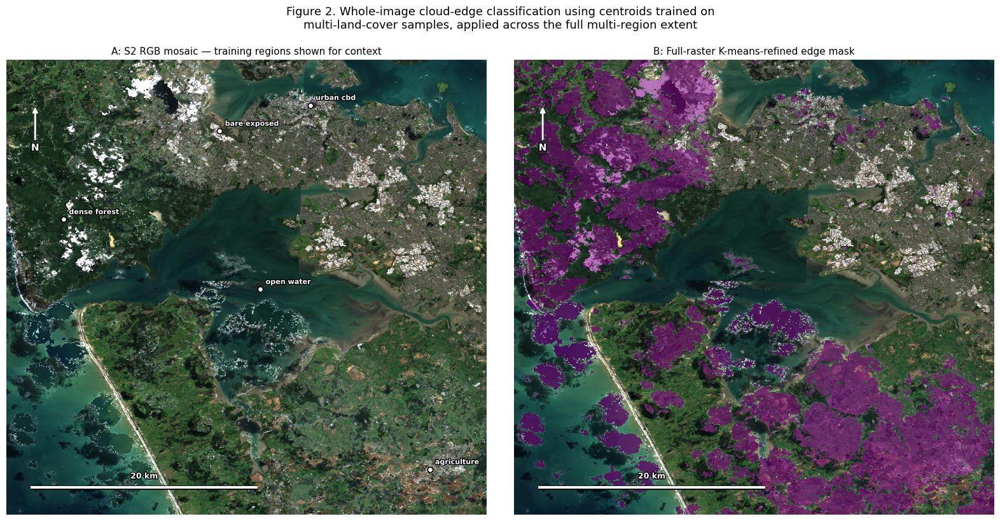

In [132]:
# # ---- Cell: classify edge pixels over the WIDE, multi-landcover mosaic ----
# cloud_interior_w, clear_interior_w, cloud_edge_w = define_cloud_zones(s2_sr_mosaic_wide)

# edge_kmeans_wide = nearest_centroid_classify(
#     s2_sr_mosaic_wide, features, cloud_center, clear_center
# ).updateMask(cloud_edge_w)

# refined_mask_wide = (s2_sr_mosaic_wide.select('cloudmask')
#                       .max(edge_kmeans_wide.unmask(0))
#                       .rename('cloudmask_refined'))






# # Figure 2 - publication-quality whole-image figure over AOI_WIDE
# import math
# import urllib.request
# import matplotlib.patheffects as pe

# # Exact rendered bounds -> needed to map lon/lat onto pixel space for labels
# wide_bounds = AOI_WIDE.bounds().getInfo()['coordinates'][0]
# lons = [pt[0] for pt in wide_bounds]
# lats = [pt[1] for pt in wide_bounds]
# min_lon, max_lon = min(lons), max(lons)
# min_lat, max_lat = min(lats), max(lats)

# rgb_url = s2_sr_mosaic_wide.getThumbURL({
#     'region': AOI_WIDE, 'dimensions': 900,
#     'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 2500, 'gamma': 1.1
# })
# mask_url = refined_mask_wide.selfMask().getThumbURL({
#     'region': AOI_WIDE, 'dimensions': 900, 'palette': ['purple'], 'min': 0, 'max': 1
# })

# urllib.request.urlretrieve(rgb_url, "rgb_wide.png")
# urllib.request.urlretrieve(mask_url, "refined_mask_wide.png")

# rgb_img = plt.imread("rgb_wide.png")
# mask_img = plt.imread("refined_mask_wide.png")
# img_h, img_w = rgb_img.shape[0], rgb_img.shape[1]

# def lonlat_to_px(lon, lat):
#     x = (lon - min_lon) / (max_lon - min_lon) * img_w
#     y = (max_lat - lat) / (max_lat - min_lat) * img_h  # flip: top of image = max lat
#     return x, y

# # Ground distance -> scale bar length, using degrees-to-km at the AOI's latitude
# center_lat = (min_lat + max_lat) / 2
# km_per_deg_lon = 111.320 * math.cos(math.radians(center_lat))
# total_km_width = (max_lon - min_lon) * km_per_deg_lon
# km_per_px = total_km_width / img_w
# scale_km = 20 if total_km_width < 150 else 50
# scale_px = scale_km / km_per_px

# fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# # Panel A: RGB with training-region labels for context
# axes[0].imshow(rgb_img)
# axes[0].set_title("A: S2 RGB mosaic — training regions shown for context", fontsize=11)
# axes[0].axis("off")

# for label, lon, lat, _ in landcover_regions:
#     x, y = lonlat_to_px(lon, lat)
#     if 0 <= x <= img_w and 0 <= y <= img_h:
#         axes[0].plot(x, y, marker='o', markersize=6,
#                      markerfacecolor='white', markeredgecolor='black', markeredgewidth=1.2)
#         axes[0].annotate(label.replace('_', ' '), (x, y), xytext=(6, 6),
#                           textcoords='offset points', fontsize=8, color='white', weight='bold',
#                           path_effects=[pe.withStroke(linewidth=2, foreground='black')])

# # Panel B: refined cloud-edge mask overlaid on RGB
# axes[1].imshow(rgb_img)
# axes[1].imshow(mask_img, alpha=0.55)
# axes[1].set_title("B: Full-raster K-means-refined edge mask", fontsize=11)
# axes[1].axis("off")

# # North arrow + scale bar on both panels
# for ax in axes:
#     ax.annotate('N', xy=(0.06, 0.90), xytext=(0.06, 0.80), xycoords='axes fraction',
#                 arrowprops=dict(arrowstyle='-|>', color='white', lw=2),
#                 ha='center', color='white', fontsize=11, weight='bold',
#                 path_effects=[pe.withStroke(linewidth=2, foreground='black')])

#     bar_x0, bar_y0 = img_w * 0.05, img_h * 0.94
#     ax.plot([bar_x0, bar_x0 + scale_px], [bar_y0, bar_y0], color='white', lw=3,
#             solid_capstyle='butt', path_effects=[pe.withStroke(linewidth=5, foreground='black')])
#     ax.text(bar_x0 + scale_px / 2, bar_y0 - img_h * 0.02, f'{scale_km} km',
#             color='white', fontsize=9, ha='center', weight='bold',
#             path_effects=[pe.withStroke(linewidth=2, foreground='black')])

# fig.suptitle("Figure 2. Whole-image cloud-edge classification using centroids trained on\n"
#              "multi-land-cover samples, applied across the full multi-region extent",
#              fontsize=13, y=1.02)
# plt.tight_layout()
# plt.savefig("figure2_full_raster_refinement.png", dpi=200, bbox_inches="tight")
# plt.show()

# Another Attempt



In [133]:
# 1. Define landcover regions & AOI
landcover_regions = [
    ("urban_cbd",      174.7633, -36.8485, 3000),
    ("dense_forest",   174.5189, -36.9617, 3000),
    ("agriculture",    174.8816, -37.2096, 3000),
    ("open_water",     174.7138, -37.0310, 3000),
    ("bare_exposed",   174.6735, -36.8741, 3000),
]

AOI_WIDE = ee.Geometry.MultiPoint(
    [[lon, lat] for _, lon, lat, _ in landcover_regions]
).bounds().buffer(5000)

s2_sr_cld_col_wide = get_s2_sr_cld_col(AOI_WIDE, START_DATE, END_DATE, CLOUD_FILTER)

# 2. Interactive Map of Sampling Areas
Map_Sampling = geemap.Map(basemap="HYBRID")
Map_Sampling.centerObject(AOI_WIDE, 9)

aoi_fc = ee.FeatureCollection([ee.Feature(AOI_WIDE)])
Map_Sampling.addLayer(aoi_fc.style(**{'color': 'yellow', 'fillColor': '00000000', 'width': 2}), {}, 'AOI WIDE Footprint')

palette = {"urban_cbd": "#e07b39", "dense_forest": "#2e8b57", "agriculture": "#c9a227", "open_water": "#1f6feb", "bare_exposed": "#8b5e3c"}

for label, lon, lat, buf in landcover_regions:
    point = ee.Geometry.Point(lon, lat)
    buffer_zone = point.buffer(buf)
    Map_Sampling.addLayer(ee.FeatureCollection([ee.Feature(buffer_zone)]).style(**{'color': palette[label], 'fillColor': palette[label] + '44', 'width': 2}), {}, f'Buffer: {label}')
    Map_Sampling.addLayer(ee.FeatureCollection([ee.Feature(point)]).style(**{'color': 'white', 'fillColor': palette[label], 'pointSize': 6}), {}, f'Center: {label}')

display(Map_Sampling)

# 3. Extract sample DataFrames
cloud_dfs, clear_dfs, edge_dfs = [], [], []

for label, lon, lat, buf in landcover_regions:
    print(f"Processing region: {label}...")
    region_geom = ee.Geometry.Point(lon, lat).buffer(buf)
    s2_region_col = get_s2_sr_cld_col(region_geom, START_DATE, END_DATE, CLOUD_FILTER)
    s2_region_mosaic = (s2_region_col.map(add_cld_shdw_mask).map(apply_cld_shdw_mask).mosaic())

    c_samp, cl_samp, e_samp = sample_zones(s2_region_mosaic, region_geom)

    c_df = fc_to_df(c_samp); c_df["landcover"] = label
    cl_df = fc_to_df(cl_samp); cl_df["landcover"] = label
    e_df = fc_to_df(e_samp); e_df["landcover"] = label

    cloud_dfs.append(c_df); clear_dfs.append(cl_df); edge_dfs.append(e_df)

cloud_df_multi = pd.concat(cloud_dfs, ignore_index=True)
clear_df_multi = pd.concat(clear_dfs, ignore_index=True)
edge_df_multi = pd.concat(edge_dfs, ignore_index=True)


from sklearn.cluster import KMeans

# 1. Define bands
features = ['B8', 'B9', 'B11', 'B12']

# 2. Combine DataFrames created in Cell 1
df_multi = pd.concat([cloud_df_multi, clear_df_multi, edge_df_multi], ignore_index=True)
X_multi = df_multi[features].dropna().values

# 3. Train K-Means
kmeans_upgraded = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans_upgraded.fit(X_multi)

# 4. Extract centroids
cluster_centers = kmeans_upgraded.cluster_centers_.tolist()
print("Upgraded Cluster Centroids:")
for i, center in enumerate(cluster_centers):
    print(f"Cluster {i}: {dict(zip(features, center))}")



Map(center=[-37.02902548078354, 174.70025000011913], controls=(WidgetControl(options=['position', 'transparent…

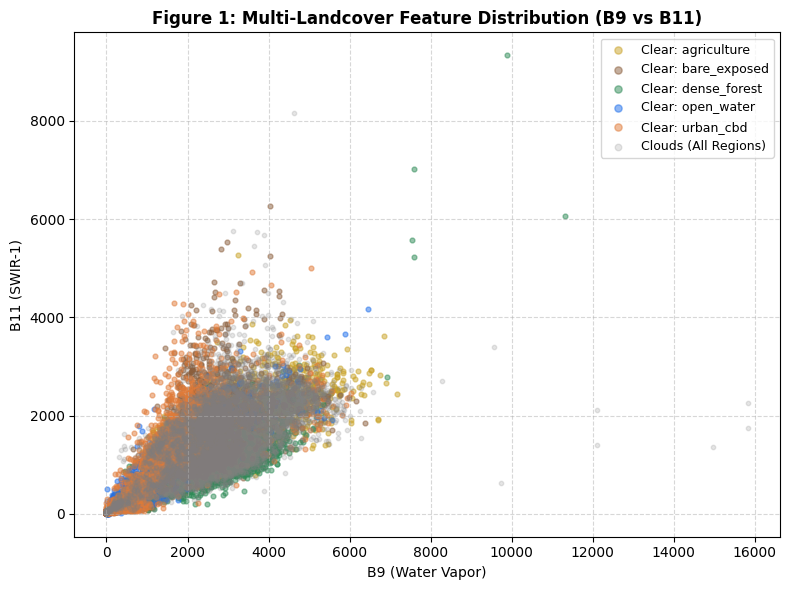

In [125]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 6))

palette = {"urban_cbd": "#e07b39", "dense_forest": "#2e8b57", "agriculture": "#c9a227", "open_water": "#1f6feb", "bare_exposed": "#8b5e3c"}

for lc, sub in clear_df_multi.groupby("landcover"):
    ax.scatter(sub["B9"], sub["B11"], s=12, alpha=0.5, label=f"Clear: {lc}", color=palette.get(lc))

ax.scatter(cloud_df_multi["B9"], cloud_df_multi["B11"], s=10, alpha=0.2, color="gray", label="Clouds (All Regions)")

ax.set_title("Multi-Landcover Feature Distribution (B9 vs B11)", fontsize=12, fontweight="bold")
ax.set_xlabel("B9 (Water Vapor)"); ax.set_ylabel("B11 (SWIR-1)")
ax.legend(markerscale=1.5, fontsize=9, frameon=True)
ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

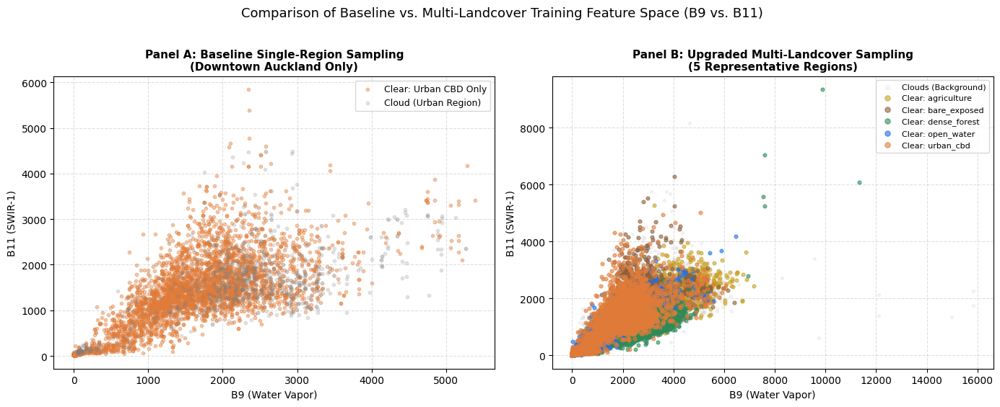

In [129]:
import matplotlib.pyplot as plt

# Create a 1x2 side-by-side panel figure
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

palette = {
    "urban_cbd": "#e07b39",
    "dense_forest": "#2e8b57",
    "agriculture": "#c9a227",
    "open_water": "#1f6feb",
    "bare_exposed": "#8b5e3c"
}

# -------------------------------------------------------------------
# PANEL A: Baseline Single-Region (Downtown Auckland Only)
# -------------------------------------------------------------------
# Clear vs Cloud in B9 vs B11 space using original single-region dfs
axes[0].scatter(clear_df["B9"], clear_df["B11"], s=10, alpha=0.4, color="#e07b39", label="Clear: Urban CBD Only")
axes[0].scatter(cloud_df["B9"], cloud_df["B11"], s=10, alpha=0.2, color="gray", label="Cloud (Urban Region)")

axes[0].set_title("Panel A: Baseline Single-Region Sampling\n(Downtown Auckland Only)", fontsize=11, fontweight="bold")
axes[0].set_xlabel("B9 (Water Vapor)")
axes[0].set_ylabel("B11 (SWIR-1)")
axes[0].legend(frameon=True, fontsize=9)
axes[0].grid(True, linestyle="--", alpha=0.4)

# -------------------------------------------------------------------
# PANEL B: Upgraded Multi-Landcover (5 Representative Domains)
# -------------------------------------------------------------------
# Clear points grouped by landcover
# 1. Plot Cloud points FIRST in the background with high transparency
axes[1].scatter(
    cloud_df_multi["B9"], cloud_df_multi["B11"],
    s=8, alpha=0.08, color="gray", label="Clouds (Background)", zorder=1
)

# 2. Plot Clear points SECOND on top, color-coded by landcover
for lc, sub in clear_df_multi.groupby("landcover"):
    axes[1].scatter(
        sub["B9"], sub["B11"],
        s=12, alpha=0.6, label=f"Clear: {lc}", color=palette.get(lc), zorder=2
    )

axes[1].set_title("Panel B: Upgraded Multi-Landcover Sampling\n(5 Representative Regions)", fontsize=11, fontweight="bold")
axes[1].set_xlabel("B9 (Water Vapor)")
axes[1].set_ylabel("B11 (SWIR-1)")
axes[1].legend(markerscale=1.5, fontsize=8, frameon=True)
axes[1].grid(True, linestyle="--", alpha=0.4)

fig.suptitle("Comparison of Baseline vs. Multi-Landcover Training Feature Space (B9 vs. B11)", fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig("figure1_part1_upgrade.png", dpi=200, bbox_inches="tight")
plt.show()

In [136]:
# =====================================================================
# EXERCISE 6, PART 2: Image-Wide K-Means Edge Pixel Classification
# =====================================================================

# 1. Convert Python K-Means cluster centroids into an Earth Engine List
ee_centers = ee.List(cluster_centers)

# 2. Define per-pixel Euclidean distance classification function
def classify_nearest_cluster(img, feature_bands, centers):
    input_img = img.select(feature_bands)

    def calc_distance(center):
        center_img = ee.Image.constant(ee.List(center))
        # Compute Euclidean distance: sqrt(sum((pixel - center)^2))
        return input_img.subtract(center_img).pow(2).reduce(ee.Reducer.sum()).sqrt()

    # Calculate distance image for each centroid
    distances = centers.map(calc_distance)

    # Convert collection to multi-band image ('b0', 'b1', 'b2')
    dist_img = ee.ImageCollection(distances).toBands()

    # Find minimum distance band index (0, 1, or 2) using expression
    # Evaluates which distance band is the minimum per pixel
    b0 = dist_img.select(0)
    b1 = dist_img.select(1)
    b2 = dist_img.select(2)

    cluster_map = (ee.Image(0)
                   .where(b1.lt(b0).And(b1.lte(b2)), 1)
                   .where(b2.lt(b0).And(b2.lt(b1)), 2)
                   .rename('cluster'))

    return cluster_map

# 3. Select single Sentinel-2 image and isolate edge pixels (30% - 60% cloud prob)
single_s2_img = s2_sr_cld_col_wide.first()
cld_prob = single_s2_img.select('probability')
edge_mask = cld_prob.gte(30).And(cld_prob.lte(60))

# 4. Classify entire image and apply edge mask
full_classified = classify_nearest_cluster(single_s2_img, features, ee_centers)
edge_classified = full_classified.updateMask(edge_mask)

# 5. Display Figure 2 Map
Map_Figure2 = geemap.Map(basemap="HYBRID")
Map_Figure2.centerObject(AOI_WIDE, 9)

# Layer 1: True Color Sentinel-2 RGB Image
Map_Figure2.addLayer(
    single_s2_img,
    {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000},
    'Sentinel-2 RGB Scene'
)

# Layer 2: Reclassified Edge Pixels (3 Clusters)
Map_Figure2.addLayer(
    edge_classified,
    {'min': 0, 'max': 2, 'palette': ['cyan', 'yellow', 'magenta']},
    'Figure 2: K-Means Reclassified Edge Pixels'
)

Map_Figure2

EEException: Image.select: Band pattern 'probability' did not match any bands. Available bands: [B1, B2, B3, B4, B5, B6, B7, B8, B8A, B9, B11, B12, AOT, WVP, SCL, TCI_R, TCI_G, TCI_B, MSK_CLDPRB, MSK_SNWPRB, QA10, QA20, QA60, MSK_CLASSI_OPAQUE, MSK_CLASSI_CIRRUS, MSK_CLASSI_SNOW_ICE]